Docker image used: [jupyter/datascience-notebook](https://hub.docker.com/r/jupyter/datascience-notebook/dockerfile)

To connect to the Jupyter server:
- `docker pull jupyter/datascience-notebook`
- `docker run -it -p host_port_number:8888 -v /your/host/directory:/home/jovyan/work --name your_container_name jupyter/datascience-notebook`
- To install additional packages as needed: `docker exec your_container_name pip install package_name`  

<h1>     🌲🌲 Peeking through Trees in Forests 🌲🌲</h1> 
<h4> A playground project to explore tree-based algorithms for forest cover type prediction.</h4>

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import validation_curve
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.externals.six import StringIO 
import graphviz
import pydotplus
 
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from matplotlib.ticker import MaxNLocator
import seaborn as sns
import plotly.express as px
import warnings
from IPython.display import Image  

%matplotlib inline
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

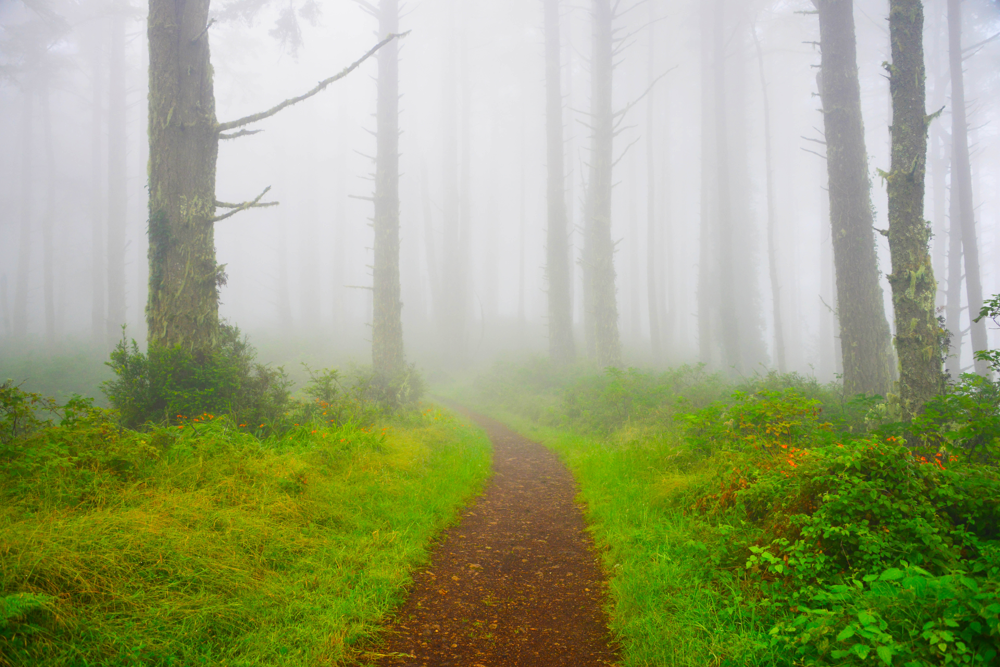

In [18]:
                                <Sky Trail, Point Reyes National Seashore>

In this playground project, I explored three tree-based algorithms (Decision Tree, Random Forest, and Gradient Boosting Machine) on the Forest Cover Type dataset (from [UCI Machine Learning Repository](http://archive.ics.uci.edu/ml/datasets/covertype)). The dataset takes forestry data from four wilderness areas in Roosevelt National forest in northern Colorado. The actual forest cover type for a given observation (30x30 meter cell) was determined from US Forest Service Region 2 Resource Information System data. The four wilderness areas represent forests with minimal human-caused disturbances, so that existing forest cover types are more a result of ecological processes rather than forest management practices. [Kaggle](https://www.kaggle.com/c/forest-cover-type-prediction) also included this dataset in one of their ML competitions for the machine learning community to use for fun and practice. The objective is to predict the classification for the forest cover type based on given features. 

## Data Exploration & Feature Engineering

#### Dimension
The training dataset has 15,120 observations with 12 features and a `Cover_Type` label. Among the features, `Wilderness_Area` and `Soil_Type` are represented as binary columns with 4 and 40 entries, respectively. In total, there are 7 cover types:
- Spruce/Fir
- Lodgepole Pine
- Ponderosa Pine
- Cottonwood/Willow
- Aspen
- Douglas-fir
- Krummholz

In [3]:
data = pd.read_csv('/home/jovyan/work/train.csv', index_col='Id')
row, col = data.shape

print("We have {:,.0f} rows and {} columns.".format(row, col))
data.head()

We have 15,120 rows and 55 columns.


,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
Id,,,,,,,,,,,,,,,,,,,,,
1,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
2,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
3,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
4,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
5,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5


#### Drop empty binary columns

In [4]:
for i in range(10, 54):
    if data.iloc[:, i].sum() == 0:
        print(data.columns[i])

Soil_Type7
Soil_Type15


In [5]:
data.drop(columns=['Soil_Type7', 'Soil_Type15'], axis=1, inplace=True)

#### Combine binary features
`Wilderness_Areas` (4 features) and `Soil_Type` (38 features) include a series of one-hot encoded features in the dataset. While tree-based models can handle continuous and categorical features simultaneously, datasets with high cardinality categorical features can make the models perform consistenly worse.

In [6]:
w = []
s = []
wilderness_label = data.columns[10:14]
soil_label = data.columns[14:-1]

for i in range(data.values.shape[0]):
    idx_w = np.argmax(data.values[:, 10:14][i])
    idx_s = np.argmax(data.values[:, 14:-1][i])
    w.append(idx_w)
    s.append(idx_s)

data_tree = data.iloc[:, 0:10].copy()
data_tree['Wilderness_Area'] = w
data_tree['Soil_Type'] = s
data_tree['Cover_Type'] = data.iloc[:, -1]

print(data_tree.shape)
data_tree.values

(15120, 13)


array([[2596,   51,    3, ...,    0,   26,    5],
       [2590,   56,    2, ...,    0,   26,    5],
       [2804,  139,    9, ...,    0,   10,    2],
       ...,
       [2492,  134,   25, ...,    2,    3,    3],
       [2487,  167,   28, ...,    2,    3,    3],
       [2475,  197,   34, ...,    2,    1,    3]])

#### Obtain feature names and class labels

In [7]:
feature_names = data_tree.columns[:-1]
label_names = ['Spruce/Fir', 'Lodgepole Pine', 'Ponderosa Pine', 'Cottonwood/Willow', 'Aspen', 'Douglas-fir', 'Krummholz']

#### Some EDA

Class distribution
- Decision tree learners can create biased trees if some classes dominate. Here, we see that all classes have an even split in the dataset, which is a good thing - no balancing is needed.

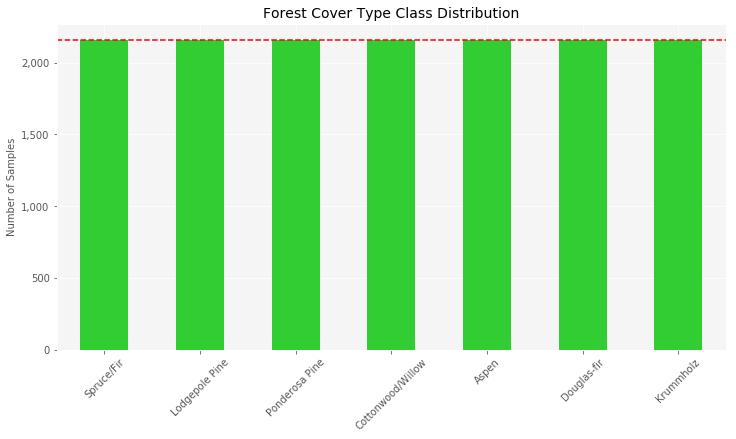

In [8]:
fig, ax = plt.subplots(figsize=(12, 6))
ax = data_tree.groupby('Cover_Type').size().plot(kind='bar', color='limegreen')
ax.set_title('Forest Cover Type Class Distribution', fontsize=14)
ax.set_ylabel("Number of Samples", fontsize=10)
ax.set_xlabel('')
ax.set_xticklabels(label_names, rotation=45)
plt.hlines(y = data_tree.groupby('Cover_Type').size()[1], xmin=-1, xmax=6.5, color = 'r', linestyles = 'dashed')

fmt = '{x:,.0f}'
ax.yaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))

Histograms of continuous features
- `Aspect`, or orientation of slope, is measured clockwise in degrees with 0 being north-facing, 90 being east-facing, 180 being south-facing, and 270 being west-facing. From the histogram, few trees are west-facing and most are north-east-facing. Is forest cover type evenly distributed among different aspects? Let's take a look later.
- Disinct clusters can be seen from the Elevation histogram. 
- How do the features interact with each other, particularly the set of hillshade indexes and distances to hydrology?

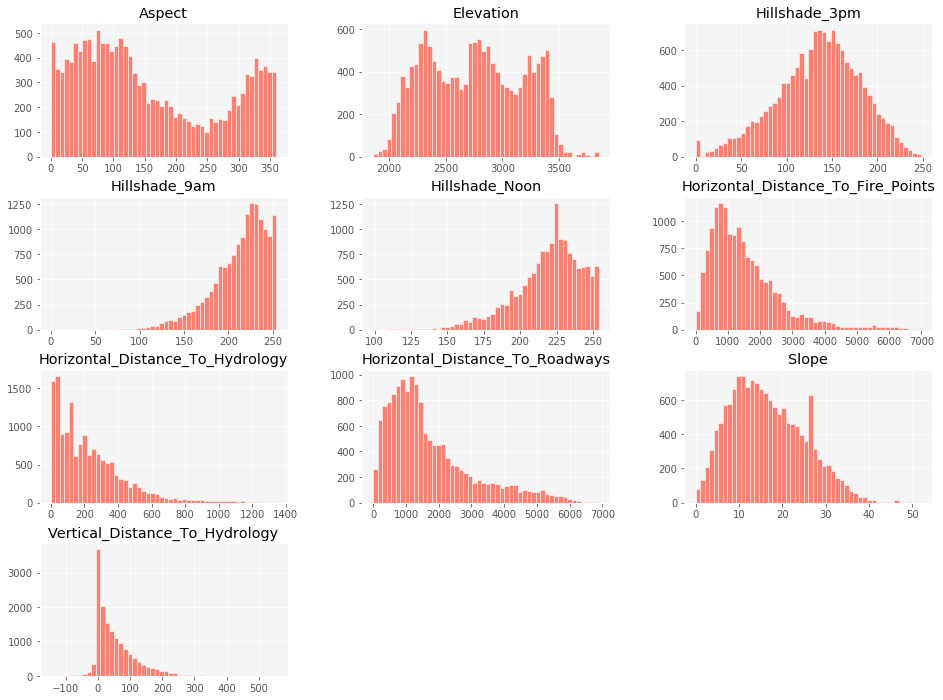

In [9]:
data_tree.iloc[:, :10].hist(figsize=(16, 12), bins=50, color='salmon', edgecolor='white')
pass

Correlation matrix of all features - several feature pairs with high correlation jump out
- Horizontal and vertical distance to hydrology 
- Hillside_Noon and Hillside_3pm
- Aspect and Hillside_3pm

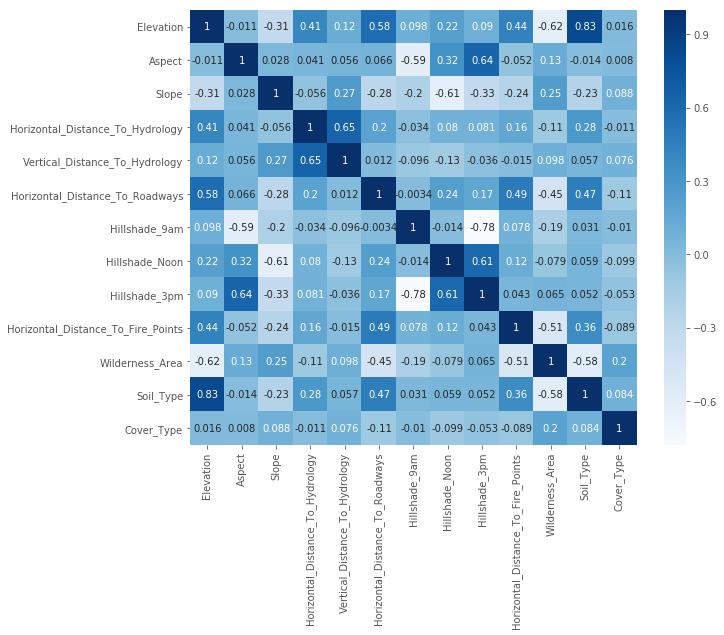

In [10]:
fig, ax = plt.subplots(figsize=(10, 8))
ax = sns.heatmap(data_tree.corr(), cmap='Blues', annot=True)

Distances to hydrology
- Horizontal and vertical distance to hydrology give an almost linear relationship
- What if we extract the euclidean distance from these two features?

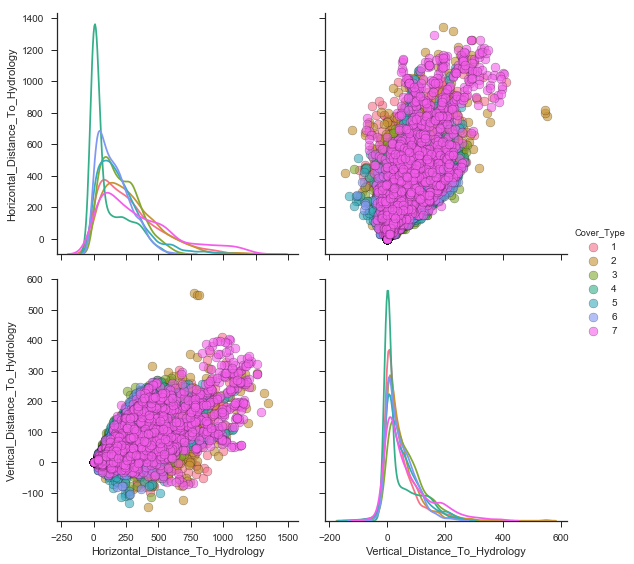

In [11]:
sns.set(style="ticks")
sns.pairplot(
    data_tree,
    vars=['Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology'],
    hue='Cover_Type',
    diag_kind = 'kde', 
    plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
    size = 4)

pass

Extract euclidean distance from vertical and horizontal distances to hydrology

In [12]:
distance = [int(math.sqrt((a - b) ** 2)) for a, b in zip(data_tree['Horizontal_Distance_To_Hydrology'], data_tree['Vertical_Distance_To_Hydrology'])]
data_tree.insert(3, 'Euclidean_Distane_To_Hydrology', distance)
data_tree.drop(['Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology'], axis=1, inplace=True)
data_tree.head()

,Elevation,Aspect,Slope,Euclidean_Distane_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area,Soil_Type,Cover_Type
Id,,,,,,,,,,,,
1,2596,51,3,258,510,221,232,148,6279,0,26,5
2,2590,56,2,218,390,220,235,151,6225,0,26,5
3,2804,139,9,203,3180,234,238,135,6121,0,10,2
4,2785,155,18,124,3090,238,238,122,6211,0,27,2
5,2595,45,2,154,391,220,234,150,6172,0,26,5


Hillshade
- Since we have 3 features representing the hillshade index, let's plot them in 3-D
- Panning around the dynamic plot below, we can see that hillshade indexes from different time of day give us a ellipsoid pattern with each other

In [13]:
temp_df = data_tree[['Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm']].copy()
temp_df['Cover_Type'] = [label_names[i-1] for i in data_tree['Cover_Type']]

fig = px.scatter_3d(
    temp_df, 
    x='Hillshade_9am', 
    y='Hillshade_Noon', 
    z='Hillshade_3pm',
    color='Cover_Type',
    title='Hillshade Features in 3-D',
    opacity=0.2, 
    color_discrete_sequence=px.colors.qualitative.Plotly[:7],
    width=1000, height=800
    )

fig.show()

How about our categorical features (`Wilderness_Area` & `Soil_Type`)? How do they interact with the continuous features?
* `Wilderness_Area` & `Elevation`
    - Wilderness area 3 seems to spread over a wide range of elevation levels
    - Wilderness area 4 and 2, on the other hand, seem to concentrate only on certain levels of elevation, especially wilderness area 4

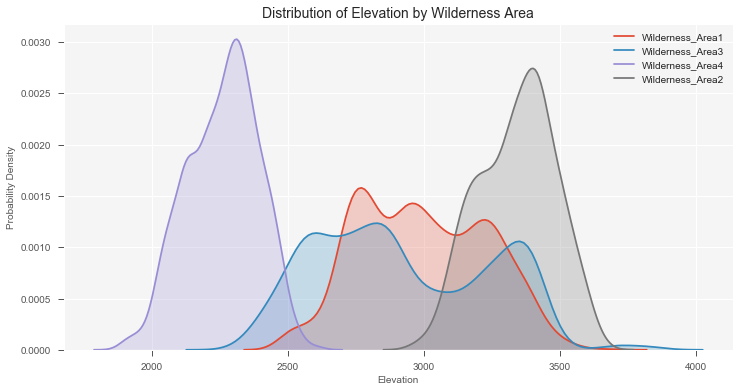

In [14]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

fig, ax = plt.subplots(figsize=(12, 6))
for area in data_tree['Wilderness_Area'].unique():
    subset = data_tree[data_tree['Wilderness_Area'] == area]
    sns.kdeplot(subset['Elevation'], shade=True, label=data.columns[10:14][area])

ax.set_title("Distribution of Elevation by Wilderness Area", fontsize=14)
ax.set_xlabel("Elevation", fontsize=10)
ax.set_ylabel("Probability Density", fontsize=10)

pass

* Forest Cover Type & Elevation
    - Does forest cover type follow certain elevation pattern?
    - Krummholz, Aspen, and Cottonwood/Willow are more selective in their habitat elevation.
    - The place where Krummholz tends to grow have the least amount of overlap with other pecies. 
    - We can verify this later but Lodgepole Pine would cause much confusion to the model. 

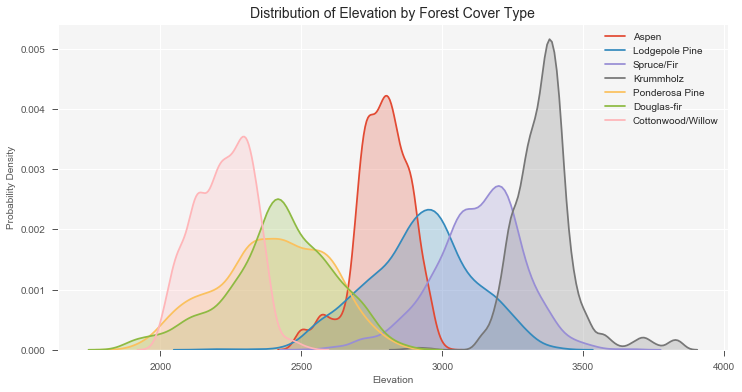

In [15]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

fig, ax = plt.subplots(figsize=(12, 6))
for area in data_tree['Cover_Type'].unique():
    subset = data_tree[data_tree['Cover_Type'] == area]
    sns.kdeplot(subset['Elevation'], shade=True, label=label_names[area-1])

ax.set_title("Distribution of Elevation by Forest Cover Type", fontsize=14)
ax.set_xlabel("Elevation", fontsize=10)
ax.set_ylabel("Probability Density", fontsize=10)

pass

Since we will only be exploring tree-based algorithms, no scaling is needed. Feature selection is also not necessary since it will be covered when we use ensemble methods. Let's start with our exploration with the 11 features below.

In [17]:
feature_names = data_tree.columns[:-1]
feature_names

Index(['Elevation', 'Aspect', 'Slope', 'Euclidean_Distane_To_Hydrology',
       'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon',
       'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points',
       'Wilderness_Area', 'Soil_Type'],
      dtype='object')

## Splitting the training set
- A "test" set is held out of the training set for performance demonstration purporses. 
- Ideally, the optimized model will be trained with the entire training set in the end before deploying to a test set that the model had never seen before.

In [18]:
seed = 0
val_size = 0.2 

data_features = data_tree.values[:, :-1]
data_labels = data_tree.values[:, -1]

train_data, test_data, train_labels, test_labels = train_test_split(data_features, data_labels, test_size=val_size, random_state=seed)
print("Train and test data shape:", train_data.shape, test_data.shape)
print("Train and test labels shape:", train_labels.shape, test_labels.shape)

Train and test data shape: (12096, 11) (3024, 11)
Train and test labels shape: (12096,) (3024,)


#### Visualize the dataset
- Since we have 11 dimensions in our dataset, we need to reduce its dimensions to 3D using PCA
- 3 dimensions won't cover 100% of the variations in our dataset, but will give us a rough idea of what we have
- PCA with 3 components cover 98.8% of the variance

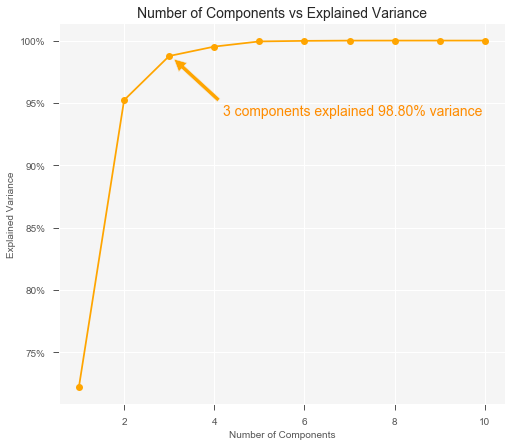

In [19]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

explained_var = []
for n in range(1, 11):
    pca = PCA(n_components=n)
    pca.fit(train_data)
    var = pca.explained_variance_ratio_.sum()
    explained_var.append(var)

fig, ax = plt.subplots(figsize=(8, 7))
ax.plot(range(1, 11), explained_var, marker='o', c='orange')
ax.set_title("Number of Components vs Explained Variance", fontsize=14)
ax.set_xlabel("Number of Components", fontsize=10)
ax.set_ylabel("Explained Variance", fontsize=10)

fmt = '{x:,.0%}'
ax.yaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))

pca = PCA(n_components=3)
data_3d = pca.fit_transform(train_data)
var_3 = round(pca.explained_variance_ratio_.sum(), 3)
ax.annotate('3 components explained {:.2%} variance'.format(var_3), xy=(3.05, var_3-0.001), xytext=(4.2, 0.94),
            fontsize=14, color='darkorange', arrowprops=dict(facecolor='orange', shrink=0.05))

pass

It's fun to explore in the 3-D space, isn't it? 

In [20]:
temp_df = pd.DataFrame(data_3d, columns=['PC1', 'PC2', 'PC3'])
temp_df['Cover_Type'] = [label_names[i-1] for i in train_labels]

fig = px.scatter_3d(
    temp_df, 
    x='PC1', 
    y='PC2', 
    z='PC3',
    color='Cover_Type', 
    title='Forest Cover Type with 3 Components in 3D',
    opacity=0.2, 
    color_discrete_sequence=px.colors.qualitative.Plotly[:7],
    width=1000, height=800
    )

fig.show()

## Decision Tree

The decision tree algorithm loops through all features to start with the best one whose split results in the highest information gain. It keeps doing so until it runs out of features to split on or when splitting becomes meaningless. Let's optimize the decision tree's `max_depth` and `min_samples_split` hyperparameters.

#### Exhaustive search 
- Use GridSearchCV to find optimal values for maximum tree depth and minimum samples required at each node before splitting 

In [21]:
dt = DecisionTreeClassifier(criterion='entropy', random_state=1234)

grid_params = {
    'max_depth': [1,2,3,4,5,6, 7, 8, 9, 10],
    'min_samples_leaf': [2, 4, 6, 10, 15, 20, 30, 40, 60, 80]
}

grid_object = GridSearchCV(estimator = dt, param_grid = grid_params, scoring = 'accuracy', cv = 10, n_jobs = 1)
grid_object.fit(train_data, train_labels)
grid_object.best_params_

{'max_depth': 10, 'min_samples_leaf': 2}

#### Maximum depth of the tree (1 to 20)

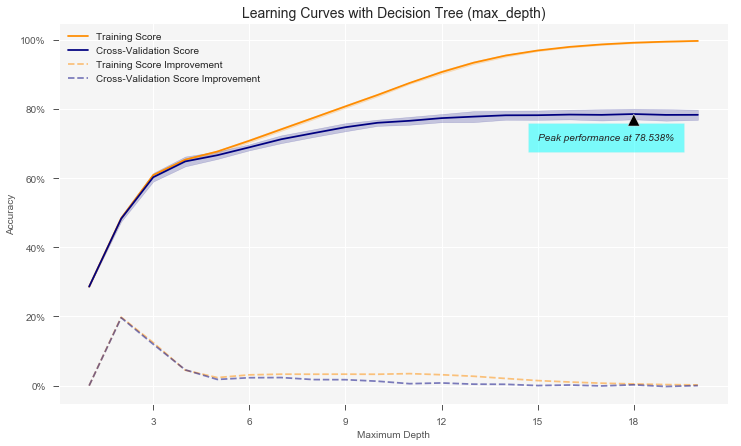

In [22]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

# Loop the DT algorithm through various maximum depth values
param_range = range(1, 21)
train_scores, test_scores = validation_curve(
    DecisionTreeClassifier(criterion='entropy', random_state=1234),
    train_data,
    train_labels,
    param_name='max_depth',
    param_range=param_range,
    scoring='accuracy',
    n_jobs=1,
    cv=10)

# Take mean and standard deviation values of all training and learning scores
# train_scores abd test_scores are both a 20x5 matrix (20 candidates and 5 CV iterations)
# train_scores_mean and test_scores_mean are then an 20 element array, same as []_sd 
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_sd = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_sd = np.std(test_scores, axis=1)
test_scores_diff = np.append(0, np.diff(test_scores_mean))
train_scores_diff = np.append(0, np.diff(train_scores_mean))

# Plot the learning curve
fig, ax = plt.subplots(figsize=(12, 7))
ax.plot(param_range, train_scores_mean, color='darkorange', label='Training Score')
ax.plot(param_range, test_scores_mean, color='navy', label='Cross-Validation Score')
ax.plot(param_range, train_scores_diff, color='darkorange', label='Training Score Improvement', 
    alpha=0.5, linestyle='--')
ax.plot(param_range, test_scores_diff, color='navy', label='Cross-Validation Score Improvement', 
    alpha=0.5, linestyle='--')
ax.fill_between(param_range, train_scores_mean-train_scores_sd, train_scores_mean+train_scores_sd, 
    alpha=0.2, 
    color='darkorange')
ax.fill_between(param_range, test_scores_mean-test_scores_sd, test_scores_mean+test_scores_sd, 
    alpha=0.2, 
    color='navy')

# Identify peak cross-validation performance
peak_score = test_scores_mean.max()
peak_score_idx = np.argmax(test_scores_mean)
ax.text(15, 0.71, 'Peak performance at {:.3%}'. format(peak_score), style='italic',
        bbox={'facecolor': 'cyan', 'alpha': 0.5, 'pad': 10})
ax.annotate(' ', xy=(param_range[peak_score_idx], peak_score),
            arrowprops=dict(facecolor='black', shrink=0))

ax.set_title("Learning Curves with Decision Tree (max_depth)", fontsize=14)
ax.set_xlabel("Maximum Depth", fontsize=10)
ax.set_ylabel("Accuracy", fontsize=10)
ax.legend()

fmt = '{x:,.0%}'
ax.yaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

pass

Accuracy peaked at 78.538% when max-depth is 18. However, when the tree is that deep, variance is also significantly high, as shown by the gap between the training and validation curves. In fact, any max_depth values above 10 seem to risk overfitting with little performance improvement. Given that there are 11 features in the dataset, let's keep max_depth at 10 (~76.01% accuracy) and see how min_samples_split values interact with the model.

#### Minimum samples required at each node before splitting (2 to 80)

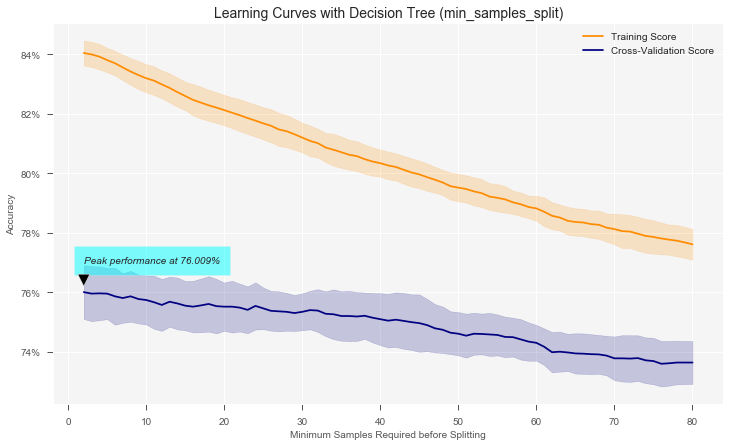

In [23]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

# Loop the DT algorithm through various min_samples_split values while keeping max_depth at 10
param_range = range(2, 81)
train_scores, test_scores = validation_curve(
    DecisionTreeClassifier(criterion='entropy', max_depth=10, random_state=1234),
    train_data,
    train_labels,
    param_name='min_samples_split',
    param_range=param_range,
    scoring='accuracy',
    n_jobs=1,
    cv=10)

# Take mean and standard deviation values of all training and learning scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_sd = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_sd = np.std(test_scores, axis=1)

# Plot the learning curve
fig, ax = plt.subplots(figsize=(12, 7))
ax.plot(param_range, train_scores_mean, color='darkorange', label='Training Score')
ax.plot(param_range, test_scores_mean, color='navy', label='Cross-Validation Score')
ax.fill_between(param_range, train_scores_mean-train_scores_sd, train_scores_mean+train_scores_sd, 
    alpha=0.2, 
    color='darkorange')
ax.fill_between(param_range, test_scores_mean-test_scores_sd, test_scores_mean+test_scores_sd, 
    alpha=0.2, 
    color='navy')

# Identify peak cross-validation performance
peak_score = test_scores_mean.max()
peak_score_idx = np.argmax(test_scores_mean)
ax.text(2, 0.77, 'Peak performance at {:.3%}'. format(peak_score), style='italic',
        bbox={'facecolor': 'cyan', 'alpha': 0.5, 'pad': 10})
ax.annotate(' ', xy=(param_range[peak_score_idx], peak_score+0.002), 
            xytext=(param_range[peak_score_idx], peak_score+0.007),
            arrowprops=dict(facecolor='black', shrink=0))

ax.set_title("Learning Curves with Decision Tree (min_samples_split)", fontsize=14)
ax.set_xlabel("Minimum Samples Required before Splitting", fontsize=10)
ax.set_ylabel("Accuracy", fontsize=10)
ax.legend()

fmt = '{x:,.0%}'
ax.yaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))
pass

Even though when minimum samples required equals to 2, the model delivers peak performance, let's dial it up to 20 to reduce the risk of overfitting while still keeping a resonable amount of accuracy. 

#### Single tree with `max_depth`=10 and `min_samples_split`=20

In [24]:
dt = DecisionTreeClassifier(criterion='entropy', min_samples_split=20, max_depth = 10, random_state=1234)
dt.fit(train_data, train_labels)
y_predict = dt.predict(test_data)

print("Accuracy: {:.3%}".format(dt.score(test_data, test_labels)))
print(metrics.classification_report(test_labels, y_predict))

Accuracy: 74.802%
              precision    recall  f1-score   support

           1       0.71      0.63      0.67       439
           2       0.59      0.57      0.58       411
           3       0.62      0.74      0.68       418
           4       0.87      0.92      0.90       438
           5       0.77      0.85      0.81       428
           6       0.77      0.60      0.67       471
           7       0.89      0.92      0.90       419

    accuracy                           0.75      3024
   macro avg       0.75      0.75      0.75      3024
weighted avg       0.75      0.75      0.75      3024



#### Confusion matrix of a single decision tree 

In [25]:
dt = DecisionTreeClassifier(criterion='entropy', min_samples_split=20, max_depth = 10, random_state=1234)
dt.fit(train_data, train_labels)
y_predict = dt.predict(test_data)
labels = np.unique(test_labels)

cm = metrics.confusion_matrix(test_labels, y_predict, labels=labels)
cm_df = pd.DataFrame(cm, index=['Actual: ' + label_names[i] for i in range(7)], columns=['Predicted: ' + label_names[i] for i in range(7)])
cm_df

,Predicted: Spruce/Fir,Predicted: Lodgepole Pine,Predicted: Ponderosa Pine,Predicted: Cottonwood/Willow,Predicted: Aspen,Predicted: Douglas-fir,Predicted: Krummholz
Actual: Spruce/Fir,278,107,1,0,12,1,40
Actual: Lodgepole Pine,81,236,10,0,62,15,7
Actual: Ponderosa Pine,0,5,311,37,9,56,0
Actual: Cottonwood/Willow,0,0,25,404,0,9,0
Actual: Aspen,0,42,17,0,365,4,0
Actual: Douglas-fir,0,7,134,21,26,283,0
Actual: Krummholz,32,2,0,0,0,0,385


Douglas-Fir and Ponderosa Pine seem to be the most confused pair. It makes sense given how much those two forest cover types overlap with each other in the 3-D space earlier. Let's visualize the most confused pair and one of the least confused pairs of forest cover type in 2-D.

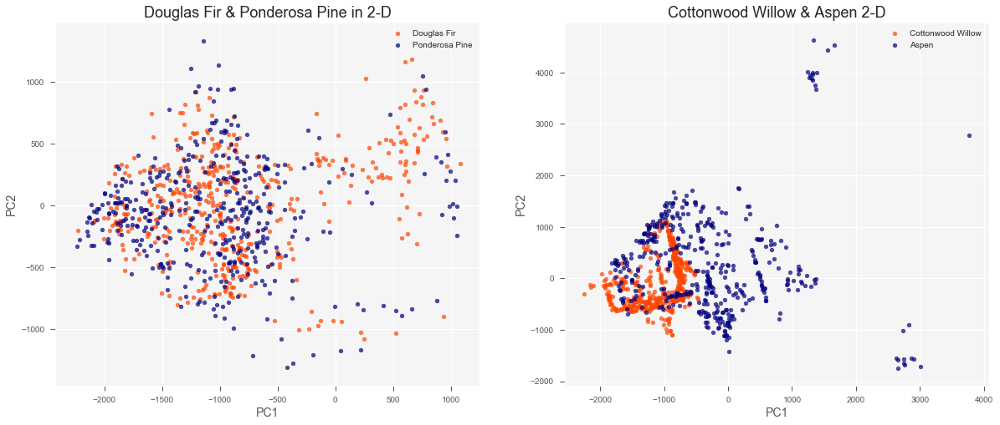

In [26]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

# Create a dataframe for the test dataset
test_data_df = pd.DataFrame(test_data, columns=feature_names)

# Apply PCA with 2 components on test dataset
pca = PCA(n_components=2)
data_proj = pca.fit_transform(test_data_df)

# Create dataframe that holds the 2-d data
data_2d = pd.DataFrame(data_proj, columns=['PC1', 'PC2'])

# Attach labels
data_2d['label'] = test_labels

# Visualize the most confused pair and one of the least confused pairs 
douglas_fir = data_2d[data_2d['label'] == 6]   
ponderosa_pine = data_2d[data_2d['label'] == 3]

cottonwood_Willow = data_2d[data_2d['label'] == 4]
aspen = data_2d[data_2d['label'] == 5]

# Most confused pair
fig, ax = plt.subplots(1, 2, figsize=(20, 8))
ax[0].scatter(douglas_fir['PC1'], douglas_fir['PC2'], c='orangered', marker='.', s=90, label='Douglas Fir', alpha=0.7)
ax[0].scatter(ponderosa_pine['PC1'], ponderosa_pine['PC2'], c='navy', marker='.', s=90, label='Ponderosa Pine', alpha=0.7)
ax[0].set_xlabel('PC1', fontsize=14)
ax[0].set_ylabel('PC2', fontsize=14)
ax[0].legend()
ax[0].set_title('Douglas Fir & Ponderosa Pine in 2-D', fontsize=18)

# Least confused pair 1
ax[1].scatter(cottonwood_Willow['PC1'], cottonwood_Willow['PC2'], c='orangered', marker='.', s=90, label='Cottonwood Willow', alpha=0.7)
ax[1].scatter(aspen['PC1'], aspen['PC2'], c='navy', marker='.', s=90, label='Aspen', alpha=0.7)
ax[1].set_xlabel('PC1', fontsize=14)
ax[1].set_ylabel('PC2', fontsize=14)
ax[1].legend()
ax[1].set_title('Cottonwood Willow & Aspen 2-D', fontsize=18)

pass

What about only the mislabelled ones between the most confused pair?

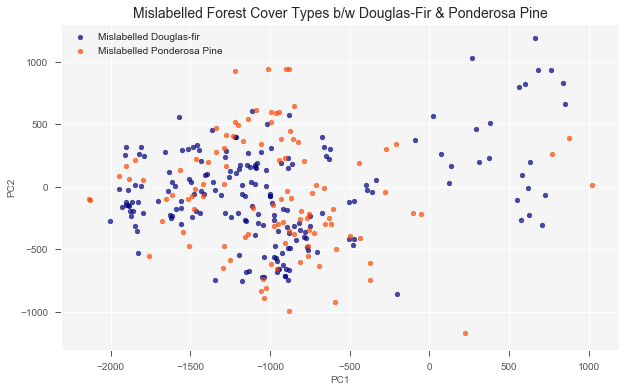

In [27]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

# Identify indices (row, col) of max value from confusion matrix 
cm_copy = cm.copy()
np.fill_diagonal(cm_copy, 0)
row, col = np.unravel_index(np.argmax(cm_copy), cm_copy.shape)

# Extract mislabelled data points
data_2d['correct'] = y_predict == test_labels
data_2d_mis = data_2d[data_2d['correct'] == 0]

# The mislabelled pairs
fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(data_2d_mis[data_2d_mis['label'] == row+1]['PC1'], 
           data_2d_mis[data_2d_mis['label'] == row+1]['PC2'], 
           c='navy', marker='.', s=90, label='Mislabelled ' + label_names[row],
           alpha=0.7
          )

ax.scatter(data_2d_mis[data_2d_mis['label'] == col+1]['PC1'], 
           data_2d_mis[data_2d_mis['label'] == col+1]['PC2'], 
           c='orangered', marker='.', s=90, label='Mislabelled ' + label_names[col],
           alpha=0.7
          )

ax.legend()
ax.set_xlabel('PC1', fontsize=10)
ax.set_ylabel('PC2', fontsize=10)
ax.set_title('Mislabelled Forest Cover Types b/w Douglas-Fir & Ponderosa Pine', fontsize=14)

pass

#### Feature importance from one single tree

                               feature  importance
0                            Elevation    0.616309
10                           Soil_Type    0.107207
4      Horizontal_Distance_To_Roadways    0.051853
8   Horizontal_Distance_To_Fire_Points    0.048956
3       Euclidean_Distane_To_Hydrology    0.041069
5                        Hillshade_9am    0.040488
9                      Wilderness_Area    0.034287
6                       Hillshade_Noon    0.027562
1                               Aspect    0.016268
7                        Hillshade_3pm    0.011442
2                                Slope    0.004558


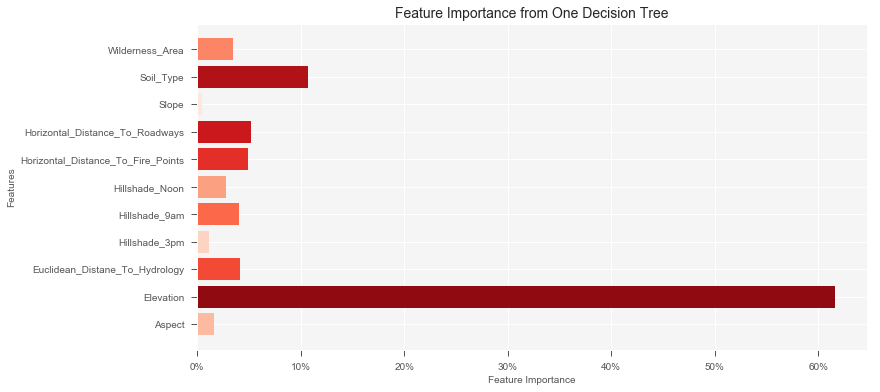

In [28]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

# Same tree with optimized hyperparameters
dt = DecisionTreeClassifier(criterion='entropy', min_samples_split=20, max_depth = 10, random_state=1234)
dt.fit(train_data, train_labels)

# Plot feature importance from the tree
feature_df = pd.DataFrame()
feature_df['feature'] = feature_names
feature_df['importance'] = dt.feature_importances_
feature_df.sort_values(by='importance', ascending=False, inplace=True)

print(feature_df)

pal = sns.color_palette('Reds', 11) 
colordict = {
    'Elevation': pal[10],
    'Soil_Type': pal[9],
    'Horizontal_Distance_To_Roadways': pal[8],
    'Horizontal_Distance_To_Fire_Points': pal[7],
    'Euclidean_Distane_To_Hydrology': pal[6],
    'Hillshade_9am': pal[5],
    'Wilderness_Area': pal[4],
    'Hillshade_Noon': pal[3],
    'Aspect': pal[2],
    'Hillshade_3pm': pal[1],
    'Slope': pal[0]
}

fig, ax = plt.subplots(figsize=(12, 6))
ax.barh(feature_df['feature'], feature_df['importance'], align='center', color=[colordict[i] for i in feature_df.feature])
ax.set_title('Feature Importance from One Decision Tree', fontsize=14)
ax.set_ylabel('Features', fontsize=10)
ax.set_xlabel('Feature Importance', fontsize=10)

fmt = '{x:,.0%}'
ax.xaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))

pass

#### What if we keep only selected features based on their importance level?

Peak performance reached at 75.331% when number of important features is 8 and when the importance threshold is 0.95.


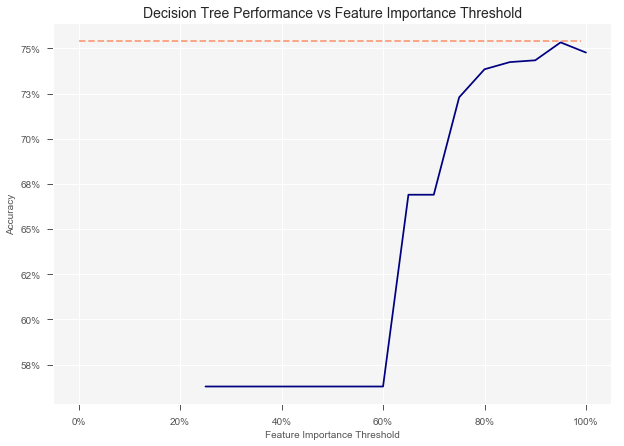

In [29]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

# Cumulative feature importanes
feature_importances = list(zip(feature_df['feature'], dt.feature_importances_))
cumulative_importances = np.cumsum(feature_df['importance'])
accuracy_list = []
feature_count_list = []

threshold_list = np.arange(0.25, 1.05, 0.05)
for importance_threshold in threshold_list:
    
    # Find number of features for cumulative importance bigger than threshold
    feature_idx = np.where(cumulative_importances > importance_threshold)[0][0]

    # New training and test sets with the most important features
    important_feature_names = [feature[0] for feature in feature_importances[0:feature_idx+1]]
    important_indices = [list(feature_names).index(feature) for feature in important_feature_names]
    important_train_features = train_data[:, important_indices]
    important_test_features = test_data[:, important_indices]
    
    # Fit the DT classifier with important features
    dt_important = DecisionTreeClassifier(criterion='entropy', min_samples_split=20, max_depth = 10, random_state=1234)
    dt_important.fit(important_train_features, train_labels)
    y_predict = dt_important.predict(important_test_features)

    accuracy_list.append(dt_important.score(important_test_features, test_labels))
    feature_count_list.append(important_train_features.shape[1])

fig, ax = plt.subplots(figsize=(10, 7))
ax.plot(threshold_list, accuracy_list, color='navy')

ax.set_title("Decision Tree Performance vs Feature Importance Threshold", fontsize=14)
ax.set_xlabel("Feature Importance Threshold", fontsize=10)
ax.set_ylabel("Accuracy", fontsize=10)
plt.hlines(y = max(accuracy_list)+0.001, xmin=0, xmax=0.99, color = 'orangered', linestyles = 'dashed', alpha=0.5)

fmt = '{x:,.0%}'
ax.yaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))
ax.xaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))

print('Peak performance reached at {:0.3%} when number of important features is {:.0f} and when the importance threshold is {:.2f}.'.format(
    max(accuracy_list), 
    feature_count_list[np.argmax(accuracy_list)],
    threshold_list[np.argmax(accuracy_list)]))

One single decision tree seems to deliver around 75% accuracy. It's obvious from the confusion plots why some pairs got the tree confused. Elevation seems to be the most important feature for the algorithm, and not all features are contributing positively to model performance. What does the tree look like?

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.721105 to fit



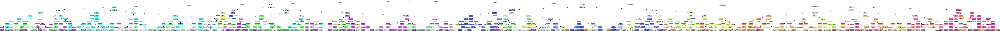

In [30]:
dt = DecisionTreeClassifier(criterion='entropy', min_samples_split=20, max_depth=10, random_state=1234)
dt.fit(train_data, train_labels)

dot_data = StringIO()
export_graphviz(dt, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## Random Forest

Can we do better? As seen from the decision tree algorithms above, simple trees suffer from large bias while complex trees suffer from large variance. How can we reduce bias without introducing as much variance? Let's try some **ensemble** methods. I will start with parallel ensemble methods (bagging), then move to sequential ensemble methods (boosting). 

Random forests produce a distribution of simple trees on randomly selected subsets of data and features before selecting the best solution by means of voting. A decision tree can be unstable because small variations in the dataset might result in a completely different tree being generated. The combination of the randomization and the averaging effect reduces the variance of a decision tree. 

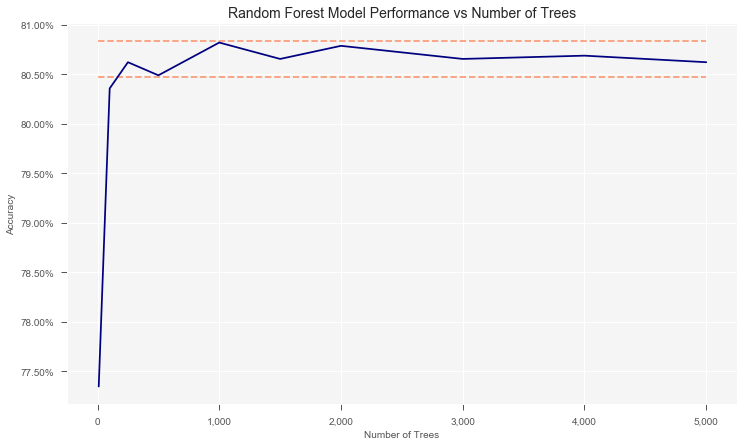

In [38]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

n_estimators_list = [10, 100, 250, 500, 1000, 1500, 2000, 3000, 4000, 5000]
accuracy_list = []
estimators_list = []

for n in n_estimators_list:
    rfc = RandomForestClassifier(criterion='entropy', n_estimators=n, min_samples_split=20, max_depth=10, random_state=1234)
    rfc.fit(train_data, train_labels)
    
    accuracy_list.append(rfc.score(test_data, test_labels))

fig, ax = plt.subplots(figsize=(12, 7))
ax.plot(n_estimators_list, accuracy_list, color='navy')

ax.set_title("Random Forest Model Performance vs Number of Trees", fontsize=14)
ax.set_xlabel("Number of Trees", fontsize=10)
ax.set_ylabel("Accuracy", fontsize=10)
plt.hlines(y=max(accuracy_list)+0.0002, xmin=0, xmax=5000, color='orangered', linestyles = 'dashed', alpha=0.5)
plt.hlines(y=max(accuracy_list)-0.0035, xmin=0, xmax=5000, color='orangered', linestyles = 'dashed', alpha=0.5)

fmt = '{x:,.2%}'
ax.yaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))
fmt = '{x:,.0f}'
ax.xaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))

Model performance seems to be stablizing (+/- 0.5%) once there are at least 2,000 trees/estimators in the forest. Let's proceed with `n_estimators`=2,000 while keeping the other hyperparameter values the same as the decision tree.

In [39]:
rfc = RandomForestClassifier(criterion='entropy', n_estimators=2000, min_samples_split=20, max_depth=10, random_state=1234)
rfc.fit(train_data, train_labels)
y_predict = rfc.predict(test_data)

print(metrics.classification_report(test_labels, y_predict))
print ('Accuracy: {:.3%}'.format(rfc.score(test_data, test_labels)))

              precision    recall  f1-score   support

           1       0.74      0.73      0.73       439
           2       0.72      0.60      0.65       411
           3       0.74      0.77      0.75       418
           4       0.89      0.98      0.93       438
           5       0.84      0.91      0.87       428
           6       0.81      0.74      0.77       471
           7       0.90      0.93      0.92       419

    accuracy                           0.81      3024
   macro avg       0.80      0.81      0.80      3024
weighted avg       0.80      0.81      0.80      3024

Accuracy: 80.787%


If we were to juxtapose the model performance vs maximum tree depth plots for both the decision tree and the random forest, we can confirm the reduction in bias and variance.

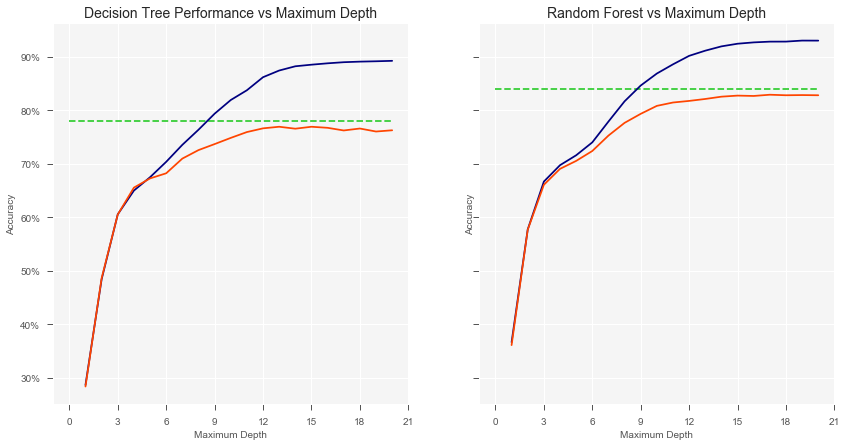

In [40]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

max_depths = range(1, 21)
accuracy_test_list_tree, accuracy_train_list_tree, accuracy_test_list_forest, accuracy_train_list_forest = ([] for i in range(4))

for max_depth in max_depths:
    
    # Decision tree
    dt = DecisionTreeClassifier(criterion='entropy', max_depth=max_depth, min_samples_split=20, random_state=1234)
    dt.fit(train_data, train_labels)
    accuracy_train_tree = dt.score(train_data, train_labels)
    accuracy_test_tree = dt.score(test_data, test_labels)
    accuracy_train_list_tree.append(accuracy_train_tree)
    accuracy_test_list_tree.append(accuracy_test_tree)
    
    # Random forest
    rfc = RandomForestClassifier(criterion='entropy', n_estimators=2000, max_depth = max_depth, min_samples_split=20, random_state=1234)
    rfc.fit(train_data, train_labels)
    accuracy_train_forest = rfc.score(train_data, train_labels)
    accuracy_test_forest = rfc.score(test_data, test_labels)
    accuracy_train_list_forest.append(accuracy_train_forest)
    accuracy_test_list_forest.append(accuracy_test_forest)

fig, ax = plt.subplots(1, 2, figsize=(14, 7), sharey=True)
ax[0].plot(max_depths, accuracy_train_list_tree, color='navy', label='Training Score')
ax[0].plot(max_depths, accuracy_test_list_tree, color='orangered', label='Test Score')
ax[0].set_title('Decision Tree Performance vs Maximum Depth', fontsize=14)
ax[0].set_xlabel('Maximum Depth', fontsize=10)
ax[0].set_ylabel('Accuracy', fontsize=10)
ax[0].hlines(y = max(accuracy_test_list_tree)+0.01, xmin=0, xmax=20, color = 'limegreen', linestyles = 'dashed')

fmt = '{x:,.0%}'
ax[0].yaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))
ax[0].xaxis.set_major_locator(MaxNLocator(integer=True))

ax[1].plot(max_depths, accuracy_train_list_forest, color='navy', label='Training Score')
ax[1].plot(max_depths, accuracy_test_list_forest, color='orangered', label='Test Score')
ax[1].set_title('Random Forest vs Maximum Depth', fontsize=14)
ax[1].set_xlabel('Maximum Depth', fontsize=10)
ax[1].set_ylabel('Accuracy', fontsize=10)
ax[1].hlines(y = max(accuracy_test_list_forest)+0.01, xmin=0, xmax=20, color = 'limegreen', linestyles = 'dashed')

fmt = '{x:,.0%}'
ax[1].yaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))
ax[1].xaxis.set_major_locator(MaxNLocator(integer=True))

pass

#### Confusion matrix for random forest
- Number of confused pairs reduced across the board 

In [41]:
y_predict = rfc.predict(test_data)
labels = np.unique(test_labels)

cm_rf = metrics.confusion_matrix(test_labels, y_predict, labels=labels)
cm_rf_df = pd.DataFrame(cm_rf, index=['Actual: ' + label_names[i] for i in range(7)], columns=['Predicted: ' + label_names[i] for i in range(7)])
cm_rf_df

,Predicted: Spruce/Fir,Predicted: Lodgepole Pine,Predicted: Ponderosa Pine,Predicted: Cottonwood/Willow,Predicted: Aspen,Predicted: Douglas-fir,Predicted: Krummholz
Actual: Spruce/Fir,320,77,1,0,6,2,33
Actual: Lodgepole Pine,69,272,13,0,38,13,6
Actual: Ponderosa Pine,0,0,339,27,3,49,0
Actual: Cottonwood/Willow,0,0,6,427,0,5,0
Actual: Aspen,0,24,9,0,389,6,0
Actual: Douglas-fir,0,5,82,12,9,363,0
Actual: Krummholz,26,0,0,0,0,0,393


#### Feature importance for the random forest, comparing to that of one single tree
- The averaging effect of the random forest shifted importance level away from elevation to other features. We were able to derive more values from other features. 

                               feature  importance
0                            Elevation    0.363159
10                           Soil_Type    0.224263
9                      Wilderness_Area    0.118419
4      Horizontal_Distance_To_Roadways    0.079233
8   Horizontal_Distance_To_Fire_Points    0.050740
3       Euclidean_Distane_To_Hydrology    0.046810
5                        Hillshade_9am    0.034817
1                               Aspect    0.026562
6                       Hillshade_Noon    0.021364
7                        Hillshade_3pm    0.019982
2                                Slope    0.014650


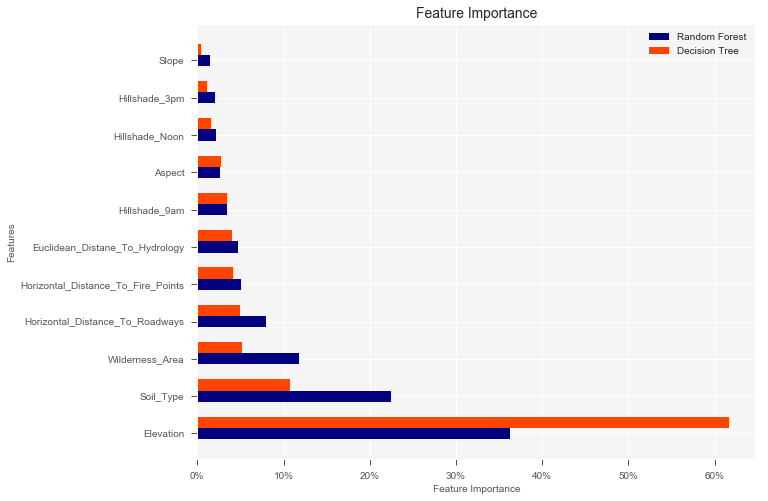

In [42]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

# Same forest with optimized hyperparameters
rfc = RandomForestClassifier(criterion='entropy', n_estimators=2000, min_samples_split=20, max_depth = 10, random_state=1234)
rfc.fit(train_data, train_labels)

# Plot feature importance for the tree and forest
feature_rf_df = pd.DataFrame()
feature_rf_df['feature'] = feature_names
feature_rf_df['importance'] = rfc.feature_importances_
feature_rf_df.sort_values(by='importance', ascending=False, inplace=True)
print(feature_rf_df)

fig, ax = plt.subplots(figsize=(10, 8))
ind = np.arange(len(feature_rf_df['feature']))
ax.barh(ind, feature_rf_df['importance'], label='Random Forest', height=0.3, color='navy')
ax.barh(ind + 0.3, feature_df['importance'], label='Decision Tree', height=0.3, color='orangered')
ax.set_yticks(ind)
ax.set_yticklabels(feature_rf_df['feature'])
ax.set_title('Feature Importance', fontsize=14)
ax.set_ylabel("Features", fontsize=10)
ax.set_xlabel("Feature Importance", fontsize=10)
ax.legend()

fmt = '{x:,.0%}'
ax.xaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))

pass

## Gradient Boosting Machine

Can we do better? Through bagging, drawing random subsets of features, and taking the majority vote of N weak learners, random forests are able to boost a single decision tree's performance while reducing variance. How can we further reduce bias?

Having explored parallel ensemble methods, let's now take a look at some sequential ensemble methods - boosting. The idea behind boosting is that we would train a series of weak learners (i.e. decision trees) iteratively so that each new learner focuses its efforts on data that was mishandled by the previous learner. In other words, subsequent learners learn from the mistake made by the previous one so that the next learner is more likely to classify correctly. In the end, we would have a strong learner with lower bias. Meanwhile, hyperparameter turning becomes crucial to prevent overfitting. 

#### Determine the learning rate and the number of weak learners that is suitable for that learning rate
- Learning rate is a weighting factor for the corrections by new trees when added to the model. A learning rate less than 1 has the effect of making less corrections for each tree added to the model.
- Since each subsequent learner learns from the mistake made by the previous one, we may not need as many trees as we did for random forest.
- There is a **trade-off** between learning rate and number of trees. If we increase learning rate, we would need less trees. If we reduce learning rate, we would need more trees. Smaller values of learning rate (to an extend) paired with larger amount of trees deliver higher accuracy, but is more prone to overfitting. Large number of trees with a low learning rate can also add computational stress. 
- One way to tune the learning rate and the number of trees is to first pick a learning rate (i.e. 0.1 - a learning rate <= 0.1 is likely to generalize better), use GridSearchCV, and see what the optimal number of trees (from a range) would be for that learning rate.
    - If the number of trees falls closer to the lower bound, we can tune down the learning rate and re-tune the number of trees suitable for that rate
    - If the number of trees falls closer to the higher bound, we can tune up the learning rate and re-tune the number of trees suitable for that rate
- Or, we can start with the number of trees by having a large number, then search for the optimal learning rate for best performance. 

An exhaustive search over number of estimatrs and learning rate 
- `n_estimators`: [100, 200, 300, 400, 500]
- `learning_rate`: [0.05, 0.075, 0.1, 0.25, 0.5, 0.75, 1]

In [43]:
gbm_test1 = GradientBoostingClassifier(min_samples_split=20, max_depth=10, subsample=0.8, random_state=1234)
grid_params = {'n_estimators': range(100, 501, 100), 'learning_rate': [0.05, 0.075, 0.1, 0.25, 0.5, 0.75, 1]}

gs_test1 = GridSearchCV(estimator=gbm_test1, param_grid=grid_params, scoring = 'accuracy', cv=3, n_jobs=1)
gs_test1.fit(train_data, train_labels)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=GradientBoostingClassifier(criterion='friedman_mse',
                                                  init=None, learning_rate=0.1,
                                                  loss='deviance', max_depth=10,
                                                  max_features=None,
                                                  max_leaf_nodes=None,
                                                  min_impurity_decrease=0.0,
                                                  min_impurity_split=None,
                                                  min_samples_leaf=1,
                                                  min_samples_split=20,
                                                  min_weight_fraction_leaf=0.0,
                                                  n_estimators=100,
                                                  n_iter_no_change=None,
                                                  presor

{'learning_rate': 0.075, 'n_estimators': 500}

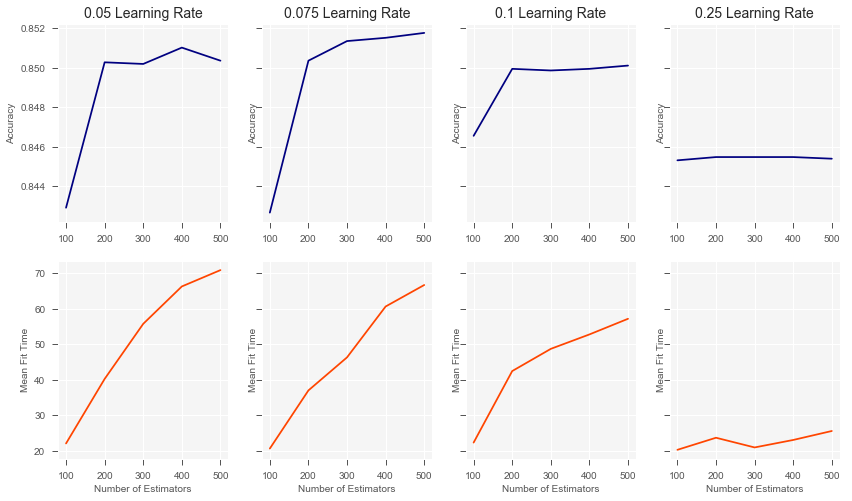

In [44]:
results = {
    'learning_rate': [gs_test1.cv_results_['params'][i]['learning_rate'] for i in range(len(gs_test1.cv_results_['params']))],
    'n_estimators': [gs_test1.cv_results_['params'][i]['n_estimators'] for i in range(len(gs_test1.cv_results_['params']))],
    'mean_test_score': gs_test1.cv_results_['mean_test_score'],
    'mean_fit_time': gs_test1.cv_results_['mean_fit_time']
}

results_df = pd.DataFrame(results)

fig, ax = plt.subplots(2, 4, figsize=(14, 8), sharey='row')
for idx, r in enumerate([0.05, 0.075, 0.1, 0.25]):
    df = results_df[results_df.learning_rate==r]
    ax[0, idx].plot(df['n_estimators'], df['mean_test_score'], color='navy')
    ax[0, idx].set_title('{} Learning Rate'.format(r), fontsize=14)
    ax[0, idx].set_ylabel('Accuracy', fontsize=10)
    
    ax[1, idx].plot(df['n_estimators'], df['mean_fit_time'], color='orangered')
    ax[1, idx].set_xlabel('Number of Estimators', fontsize=10)
    ax[1, idx].set_ylabel('Mean Fit Time', fontsize=10)

gs_test1.best_params_

The first row above shows the relationship between number of estimators (x axis) and model performance (y axis) under 4 different learning rates. The second row shows the relationship between number of estimators (x axis) and mean fit time (y axis) under the same learning rates. 

All things considered, a learning rate of 0.075 with 500 estimators seems to be an optimal pair for the dataset.  Since 500 is the upper bound of the previous search, let's run another exhaustive search with learning rate fixed at 0.75 with a different range of estimators.

In [45]:
gbm_test2 = GradientBoostingClassifier(learning_rate=0.075, min_samples_split=20, max_depth=10, subsample=0.8, random_state=1234)
grid_params = {'n_estimators': range(300, 801, 100)}

gs_test2 = GridSearchCV(estimator=gbm_test2, param_grid=grid_params, scoring='accuracy', cv=3, n_jobs=1)
gs_test2.fit(train_data, train_labels)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=GradientBoostingClassifier(criterion='friedman_mse',
                                                  init=None,
                                                  learning_rate=0.075,
                                                  loss='deviance', max_depth=10,
                                                  max_features=None,
                                                  max_leaf_nodes=None,
                                                  min_impurity_decrease=0.0,
                                                  min_impurity_split=None,
                                                  min_samples_leaf=1,
                                                  min_samples_split=20,
                                                  min_weight_fraction_leaf=0.0,
                                                  n_estimators=100,
                                                  n_iter_no_change=None,
    

{'n_estimators': 500}

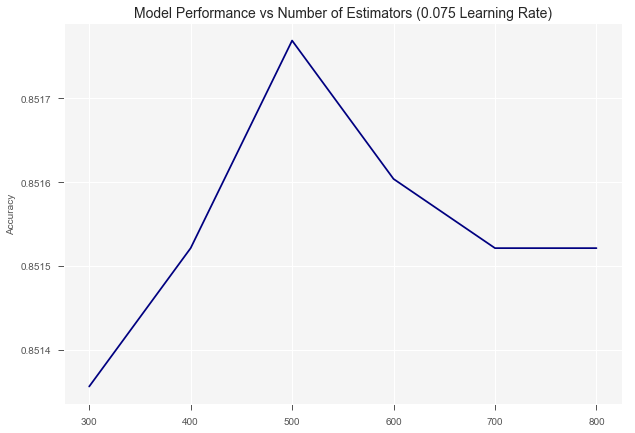

In [46]:
results_2 = {
    'n_estimators': [gs_test2.cv_results_['params'][i]['n_estimators'] for i in range(len(gs_test2.cv_results_['params']))],
    'mean_test_score': gs_test2.cv_results_['mean_test_score'],
}

results_2_df = pd.DataFrame(results_2)
fig, ax = plt.subplots(figsize=(10, 7))
ax.plot(results_2_df['n_estimators'], results_2_df['mean_test_score'], color='navy')
ax.set_title('Model Performance vs Number of Estimators (0.075 Learning Rate)', fontsize=14)
ax.set_ylabel('Accuracy', fontsize=10)
gs_test2.best_params_

Upon checking the optimal number of estimators passing the upper bound of the initial exhaustive search, we see that with a 0.075 learning rate, model performance stopped improving with more than 500 estimators. Meanwhile, the performance improvement is not significant with number of estimators increasing from 300 to 500; it may not justify the mean fit time increase as shown in the previous search results. Thus, let's use learning rate 0.075 with 300 estimators as our optimal learning rate and number of estimator pair.

#### Subsample
- The fraction of dataset to be selected for fitting each tree
- Lastly, let's take a look at the `subsample` hyperparameter and see if there is room for improvement. Values lower than 1 tends to reduce variance and increase model performance.

In [47]:
grid_params = {'subsample': [0.6, 0.7, 0.8, 0.9]}

gbm_test3 = GradientBoostingClassifier(learning_rate=0.075, n_estimators=300, min_samples_split=20, max_depth=10, random_state=1234)
gs_test3 = GridSearchCV(estimator=gbm_test3, param_grid = grid_params, scoring='accuracy', cv=3, n_jobs=1)
gs_test3.fit(train_data, train_labels)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=GradientBoostingClassifier(criterion='friedman_mse',
                                                  init=None,
                                                  learning_rate=0.075,
                                                  loss='deviance', max_depth=10,
                                                  max_features=None,
                                                  max_leaf_nodes=None,
                                                  min_impurity_decrease=0.0,
                                                  min_impurity_split=None,
                                                  min_samples_leaf=1,
                                                  min_samples_split=20,
                                                  min_weight_fraction_leaf=0.0,
                                                  n_estimators=300,
                                                  n_iter_no_change=None,
    

In [48]:
gs_test3.best_params_

{'subsample': 0.8}

#### Gradient boosting machine with optimized hyperparameters

In [49]:
gbm = GradientBoostingClassifier(learning_rate=0.075, n_estimators=300, min_samples_split=20, max_depth=10, subsample=0.8, random_state=1234)
gbm.fit(train_data, train_labels)
y_predict = gbm.predict(test_data)

print ('Accuracy: {:.3%}'.format(gbm.score(test_data, test_labels)))
print(metrics.classification_report(test_labels, y_predict))

Accuracy: 85.119%
              precision    recall  f1-score   support

           1       0.79      0.76      0.77       439
           2       0.75      0.69      0.72       411
           3       0.80      0.83      0.81       418
           4       0.93      0.97      0.95       438
           5       0.88      0.94      0.91       428
           6       0.87      0.83      0.85       471
           7       0.92      0.95      0.94       419

    accuracy                           0.85      3024
   macro avg       0.85      0.85      0.85      3024
weighted avg       0.85      0.85      0.85      3024



#### Confusion matrix for gradient boosting machine

In [50]:
y_predict = gbm.predict(test_data)
labels = np.unique(test_labels)

cm_gbm = metrics.confusion_matrix(test_labels, y_predict, labels=labels)
cm_gbm_df = pd.DataFrame(cm_gbm, index=['Actual: '+label_names[i] for i in range(7)], columns=['Predicted: '+label_names[i] for i in range(7)])
cm_gbm_df

,Predicted: Spruce/Fir,Predicted: Lodgepole Pine,Predicted: Ponderosa Pine,Predicted: Cottonwood/Willow,Predicted: Aspen,Predicted: Douglas-fir,Predicted: Krummholz
Actual: Spruce/Fir,332,70,1,0,6,1,29
Actual: Lodgepole Pine,69,283,11,0,35,8,5
Actual: Ponderosa Pine,0,1,345,26,5,41,0
Actual: Cottonwood/Willow,0,0,8,424,0,6,0
Actual: Aspen,1,17,6,0,401,3,0
Actual: Douglas-fir,0,6,60,5,9,391,0
Actual: Krummholz,20,1,0,0,0,0,398


#### Feature importance for gradient boosting, comparing to that of the decision tree and random forest
- The gradient boosting machine again re-distributed feature importance from Elevation, Soil type, and Wilderness Area to some of the other features

                               feature  importance
0                            Elevation    0.341159
10                           Soil_Type    0.210081
8   Horizontal_Distance_To_Fire_Points    0.097889
4      Horizontal_Distance_To_Roadways    0.094911
3       Euclidean_Distane_To_Hydrology    0.070002
5                        Hillshade_9am    0.060785
1                               Aspect    0.035842
6                       Hillshade_Noon    0.031275
7                        Hillshade_3pm    0.022599
9                      Wilderness_Area    0.020106
2                                Slope    0.015351


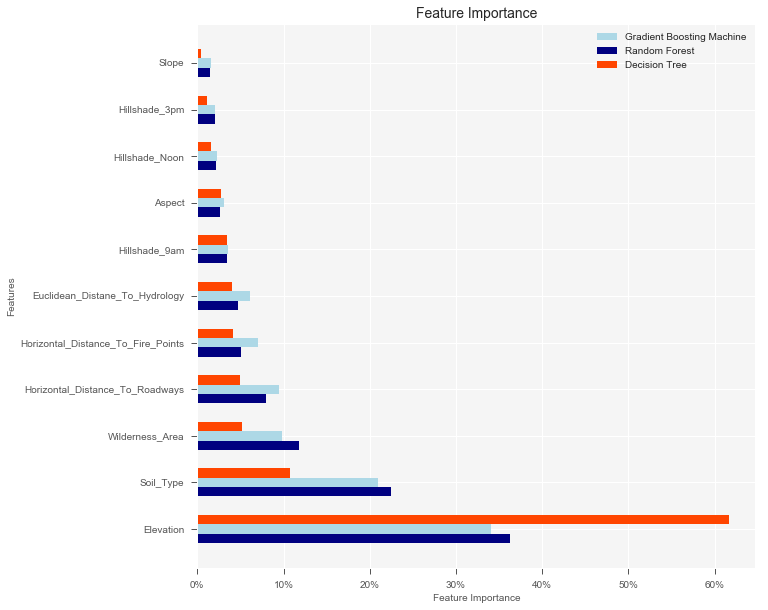

In [51]:
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = '#F5F5F5'

# The optimized Gradient Boosting Machine 
gbm = GradientBoostingClassifier(learning_rate=0.2, n_estimators=110, min_samples_split=20, max_depth = 10, random_state=1234)
gbm.fit(train_data, train_labels)
y_predict = gbm.predict(test_data)

# Plot feature importance for the tree and forest
feature_gbm_df = pd.DataFrame()
feature_gbm_df['feature'] = feature_names
feature_gbm_df['importance'] = gbm.feature_importances_
feature_gbm_df.sort_values(by='importance', ascending=False, inplace=True)
print(feature_gbm_df)

fig, ax = plt.subplots(figsize=(10, 10))
ind = np.arange(len(feature_gbm_df['feature']))
ax.barh(ind, feature_gbm_df['importance'], label='Gradient Boosting Machine', height=0.2, color='lightblue')
ax.barh(ind-0.2, feature_rf_df['importance'], label='Random Forest', height=0.2, color='navy')
ax.barh(ind+0.2, feature_df['importance'], label='Decision Tree', height=0.2, color='orangered')

ax.set_yticks(ind)
ax.set_yticklabels(feature_rf_df['feature'])
ax.set_title('Feature Importance', fontsize=14)
ax.set_ylabel("Features", fontsize=10)
ax.set_xlabel("Feature Importance", fontsize=10)
ax.legend()

fmt = '{x:,.0%}'
ax.xaxis.set_major_formatter(mtick.StrMethodFormatter(fmt))

pass

## Closing


Throughout the course of this short hike, I explored three tree-based algorithms for forest cover type prediction. We saw that ensemble learning is an effective way to improve model performance. There is much more to explore. Algorithms such as K Nearest Neighbors, Support Vector Machines, and Logistic Regression can also be used to make the classification to the dataset. We can go further in ensemble learning by blending and stacking weak learners from different families (i.e. Gradient Boosting Machines, Support Vector Machines, and K Nearest Neighbors) to develop a meta-model (using Logistic Regression or Neural Networks) that takes as inputs the outputs of our weak learners and will learn to make predictions based on them. Exciting stuff, isn't it? <br>**Happy Learning!**

Remember the enchanted forest at the beginning? Well, it turns out that there is also a lighthouse at Point Reyes. Let's pack up and close this playground project by a little $Ax = b$  🙇🏻

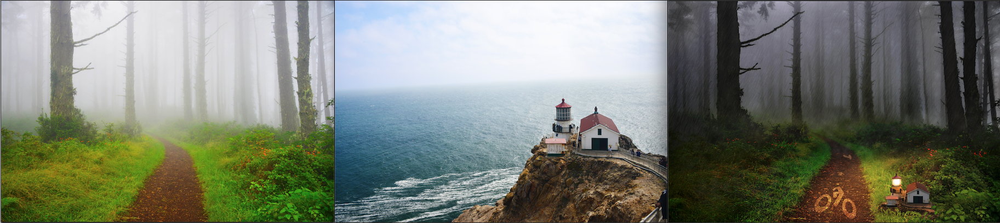

In [19]:
                                                   < Ax=b >